# Постановка задачи

Одна из проблем компании — это нечестные отели, которые накручивают себе рейтинг. Одним из способов нахождения таких отелей является построение модели, которая предсказывает рейтинг отеля. Если предсказания модели сильно отличаются от фактического результата, то, возможно, отель играет нечестно, и его стоит проверить. Вам поставлена задача создать такую модель.

## Признаки в исходном датасете
* hotel_address - адрес отеля
* review_date - дата, когда рецензент разместил соответствующий отзыв.
* average_score - средний балл отеля, рассчитанный на основе последнего комментария за последний год
* hotel_name - название отеля
* reviewer_nationality - национальность рецензента
* negative_review - отрицательный отзыв, который рецензент дал отелю.
* review_total_negative_word_counts - общее количество слов в отрицательном отзыв
* positive_review - положительный отзыв, который рецензент дал отелю
* review_total_positive_word_counts - общее количество слов в положительном отзыве
* reviewer_score - оценка, которую рецензент поставил отелю на основе своего опыта
* total_number_of_reviews_reviewer_has_given - количество отзывов, которые рецензенты дали в прошлом
* total_number_of_reviews - общее количество действительных отзывов об отеле
* tags - теги, которые рецензент дал отелю.
* days_since_review - продолжительность между датой проверки и датой очистки
* additional_number_of_scoring - есть также некоторые гости, которые просто поставили оценку сервису, а не оставили отзыв. Это число указывает, сколько там действительных оценок без проверки.
* lat - широта отеля
* lng - долгота отеля

Подробная информация о задании доступна на сайте [kaggle](https://www.kaggle.com/competitions/sf-booking)

# Импорт библиотек, загрузка данных

In [215]:
import category_encoders as ce
import matplotlib.pyplot as plt
import numpy as np
import nltk
import pandas as pd
import plotly.express as px
import seaborn as sns
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from haversine import haversine
from datetime import datetime
from sklearn import metrics
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

In [216]:
nltk.downloader.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/a.plakidin/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [217]:
%pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [218]:
RANDOM_SEED = 42
DATA_DIR = '../input/sf-booking'

df_train = pd.read_csv(DATA_DIR+'/hotels_train.csv')
#df_train = df_train.loc[:500]
df_test = pd.read_csv(DATA_DIR+'/hotels_test.csv')
#df_test = df_test.loc[:100]
sample_submission = pd.read_csv(DATA_DIR+'/submission.csv')
#sample_submission = sample_submission.loc[:100]


df_train['sample'] = 1 # помечаем где у нас трейн
df_test['sample'] = 0 # помечаем где у нас тест
df_test['reviewer_score'] = 0 # в тесте у нас нет значения reviewer_score, мы его должны предсказать, по этому пока просто заполняем нулями

dataset_eda = df_test.append(df_train, sort=False).reset_index(drop=True) # объединяем

/var/folders/cw/lkg_jfcj76df4km_0zwydjnc0000gn/T/ipykernel_36021/3412642256.py:16: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



# Исследование данных

In [219]:
display(dataset_eda)
display(dataset_eda.info())
display(dataset_eda.describe(include='all'))

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,tags,days_since_review,lat,lng,sample,reviewer_score
0,Via Senigallia 6 20161 Milan Italy,904,7/21/2017,8.1,Hotel Da Vinci,United Kingdom,Would have appreciated a shop in the hotel th...,52,16670,Hotel was great clean friendly staff free bre...,62,1,"[' Leisure trip ', ' Couple ', ' Double Room '...",13 days,45.533137,9.171102,0,0.0
1,Arlandaweg 10 Westpoort 1043 EW Amsterdam Neth...,612,12/12/2016,8.6,Urban Lodge Hotel,Belgium,No tissue paper box was present at the room,10,5018,No Positive,0,7,"[' Leisure trip ', ' Group ', ' Triple Room ',...",234 day,52.385649,4.834443,0,0.0
2,Mallorca 251 Eixample 08008 Barcelona Spain,46,11/26/2015,8.3,Alexandra Barcelona A DoubleTree by Hilton,Sweden,Pillows,3,351,Nice welcoming and service,5,15,"[' Business trip ', ' Solo traveler ', ' Twin ...",616 day,41.393192,2.161520,0,0.0
3,Piazza Della Repubblica 17 Central Station 201...,241,10/17/2015,9.1,Hotel Principe Di Savoia,United States of America,No Negative,0,1543,Everything including the nice upgrade The Hot...,27,9,"[' Leisure trip ', ' Couple ', ' Ambassador Ju...",656 day,45.479888,9.196298,0,0.0
4,Singel 303 309 Amsterdam City Center 1012 WJ A...,834,5/16/2016,9.1,Hotel Esther a,United Kingdom,No Negative,0,4687,Lovely hotel v welcoming staff,7,2,"[' Business trip ', ' Solo traveler ', ' Class...",444 day,52.370545,4.888644,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515733,9 Knaresborough Place Kensington and Chelsea L...,107,4/19/2017,9.0,Hotel Moonlight,France,No Negative,0,617,Tr s proche du metro Earl s court,10,10,"[' Leisure trip ', ' Group ', ' Club Double or...",106 day,51.494028,-0.191050,1,8.8
515734,Landstra er Hauptstra e 155 03 Landstra e 1030...,272,2/13/2017,8.4,BEST WESTERN PLUS Amedia Wien,Turkey,No Negative,0,3224,The bed was so comfy I stayed with my boyfrie...,93,1,"[' Leisure trip ', ' Couple ', ' Standard Doub...",171 day,48.192379,16.399451,1,9.2
515735,29 31 Gower Street Camden London WC1E 6HG Unit...,457,2/7/2016,6.8,Bloomsbury Palace Hotel,Netherlands,room is really small but guess is normal in L...,12,2751,great location simple check in out nice shower,9,21,"[' Business trip ', ' Solo traveler ', ' Singl...",543 day,51.520795,-0.131084,1,8.3
515736,31 Great Cumberland Place Westminster Borough ...,365,5/21/2017,8.1,The Marble Arch London,United Arab Emirates,No Negative,0,1567,Location and very comfy bed,6,28,"[' Leisure trip ', ' Solo traveler ', ' Deluxe...",74 days,51.515125,-0.160066,1,9.2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 18 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   review_date                                 515738 non-null  object 
 3   average_score                               515738 non-null  float64
 4   hotel_name                                  515738 non-null  object 
 5   reviewer_nationality                        515738 non-null  object 
 6   negative_review                             515738 non-null  object 
 7   review_total_negative_word_counts           515738 non-null  int64  
 8   total_number_of_reviews                     515738 non-null  int64  
 9   positive_review                             515738 non-null  object 
 

None

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,tags,days_since_review,lat,lng,sample,reviewer_score
count,515738,515738.000000,515738,515738.000000,515738,515738,515738,515738.000000,515738.000000,515738,515738.000000,515738.000000,515738,515738,512470.000000,512470.000000,515738.000000,515738.000000
unique,1493,NaN,731,NaN,1492,227,330011,NaN,NaN,412601,NaN,NaN,55242,731,NaN,NaN,NaN,NaN
top,163 Marsh Wall Docklands Tower Hamlets London ...,NaN,8/2/2017,NaN,Britannia International Hotel Canary Wharf,United Kingdom,No Negative,NaN,NaN,No Positive,NaN,NaN,"[' Leisure trip ', ' Couple ', ' Double Room '...",1 days,NaN,NaN,NaN,NaN
freq,4789,NaN,2585,NaN,4789,245246,127890,NaN,NaN,35946,NaN,NaN,5101,2585,NaN,NaN,NaN,NaN
mean,NaN,498.081836,NaN,8.397487,NaN,NaN,NaN,18.539450,2743.743944,NaN,17.776458,7.166001,NaN,NaN,49.442439,2.823803,0.749999,6.297672
std,NaN,500.538467,NaN,0.548048,NaN,NaN,NaN,29.690831,2317.464868,NaN,21.804185,11.040228,NaN,NaN,3.466325,4.579425,0.433014,3.902295
min,NaN,1.000000,NaN,5.200000,NaN,NaN,NaN,0.000000,43.000000,NaN,0.000000,1.000000,NaN,NaN,41.328376,-0.369758,0.000000,0.000000
25%,NaN,169.000000,NaN,8.100000,NaN,NaN,NaN,2.000000,1161.000000,NaN,5.000000,1.000000,NaN,NaN,48.214662,-0.143372,0.250000,0.625000
50%,NaN,341.000000,NaN,8.400000,NaN,NaN,NaN,9.000000,2134.000000,NaN,11.000000,3.000000,NaN,NaN,51.499981,0.010607,1.000000,7.900000
75%,NaN,660.000000,NaN,8.800000,NaN,NaN,NaN,23.000000,3613.000000,NaN,22.000000,8.000000,NaN,NaN,51.516288,4.834443,1.000000,9.600000


Пройдемся по признакам:

* hotel_address - имеет в своем составе полезную информацию о стране и городе в котором находится гостиница. На базе этого признака создами 2 новых признака.
* additional_number_of_scoring - оставим признак без изменений.
* review_date - признак может быть преобразован к стандартному типу даты и времени. Вполне возможно что дата отзыва связана в датой пребывания гостя в гостинице. Создадим 2 дополнительных признака: квартал года и признак пребывания в "высокий сезон", продолжительность которого примем с мая по сентябрь включительно.
* average_score - оставим признак без изменений.
* hotel_name - у признака 1492 уникальных значения. При использовании двоичного кодирования в датасет добавится 11 дополнительных бинарных прихнаков, что может повлиять на скорость работы модели. Но пока не известно на сколько изменится скорость работы модели, поэтому не будем сокращать количество значений признака путем ввода значения other для низкочастсных значений
* reviewer_nationality - у признака 225 уникальных значения. При использовании двоичного кодирования в датасет добавится 8 дополнительных бинарных прихнаков. Пока оставляем все значения.
* negative_review, positive_review - признак должен оказаться крайне полезым для предсказания рейтинга. Для формализации текстового отзыва воспользуемся библиотекой nltk, которая может давать тексту эмоциональную оценку.
* tags - всего имеется 2368 уникальных тэга. Попробуем выделить наиболе часто встречающеися и создать отдельный бинарные признаки для них.
* days_since_review - данный признак характеризует действие, которое произошло уже после того как пользователь проставил рейтинг и следовательно для предсказания он бесполезен.
* lat, lng - признаки, в которых имеются пропуски. На основы этой информации можно создать новый признак - удаленнойть от центра города. Пропуски можно заполнить медианным значением для данного города.
* остальный признаки имеют натуральные значения. Оставим их как есть. В самом конце они будут нормализованы или стандартизованы. 

Рассмотрим пованимательнее целевой признак "reviewer_score".

In [220]:
fig1_data = df_train['reviewer_score']
fig01 = px.box(
    fig1_data,
    x='reviewer_score',
    #color='Exited',
    height=400, width=1000,
    title='Распределение оценок гостей'
    )
fig01.show()

fig02 = px.histogram(
    df_train,
    x='reviewer_score',
    histfunc='count',
    nbins=17,
    range_x=[0,10],
    height=400, width=1000,
    title='Распределение оценок гостей'
    )
fig02.show()

Значения распределены не нормально. В левой части коробчатой диаграммы есть выбросы согласно методу межквартильного размаха. Удалим эти выбросы на этапе очистки данных.

# Генерация признаков
## hotel_address

Извлечем название старны и города и сохраним в отдельные столбцы

In [221]:
#Обработка стоки, содержащий неструкткрированный адрес гостиницы
def hotel_address_fe(addr_str):
    country, city = np.nan, np.nan
    dict_address_types = {'type01': ('United Kingdom'), 'type02': ()}

    addr_str = addr_str.split(' ')
    if ' '.join(addr_str[-2:]) in dict_address_types['type01']:
        country = ' '.join(addr_str[-2:])
        city = addr_str[-5]
    elif addr_str[-1] in dict_address_types['type02']:
        pass
    else:
        country = addr_str[-1]
        city = addr_str[-2]
    

    return pd.Series([country, city])

#Функция производящая полную обработку признака hotel_address
def hotel_address_proc(df):
    df = df.copy()

    start_time = datetime.now()
    print(f'Start hotel_address_proc() at {start_time}')
    df[['hotel_address_country', 'hotel_address_city']] = df.apply(lambda x: hotel_address_fe(x['hotel_address']), axis = 1) #Генерация новых признаков
    df[['hotel_address_country', 'hotel_address_city']] = df[['hotel_address_country', 'hotel_address_city']].astype('category')

    df.drop('hotel_address', axis = 1, inplace=True) #Удалние исходного признака
    print (f'Done in {datetime.now() - start_time}', '\n') #Для мониторинга времени обработки


    return df

## review_date
Извлечем квартал в которм был оставлен отзыв и сделаем признак "высокого сезона". Будем считать что высокий сезон длиться с мая по сентябрь включительно

In [222]:
def review_date_fe(date):
    high_mons = (5, 6, 7, 8, 9)
    date = pd.to_datetime(date)
    ishiseason = False

    quarter = date.quarter
    if date.month in high_mons: ishiseason = True

    return pd.Series([quarter, ishiseason])

def review_date_proc(df):
    df = df.copy()

    start_time = datetime.now()
    print(f'Start review_date_proc() at {start_time}')
    df[['review_date_quarter', 'review_date_ishiseason']] = df.apply(lambda x: review_date_fe(x['review_date']), axis = 1)
    df[['review_date_quarter']] = df[['review_date_quarter']].astype('category')
    df[['review_date_ishiseason']] = df[['review_date_ishiseason']].astype('bool')
    
    df.drop('review_date', axis = 1, inplace=True)
    print (f'Done in {datetime.now() - start_time}', '\n')


    return df

# negative_review
Воспользуемся сторонней библиотекой nltk для формализации текстового признака. Тесты показали что метод polarity_scores() неправильно обрабатывает некторые строки, поэтому создадим смисок наиболее частых слов neutral_words и сопоставим им значения в ручную.

In [223]:
def review_fe(review_str):
    neutral_words = ['no negative', 'nothing', 'n a', 'none', 'nil', 'no Positive']
    review_str = review_str.lower().strip(',.?! ')
    
    if review_str in neutral_words:
        compound = 0
    else:
        review_analyser = SentimentIntensityAnalyzer()
        review_scores = review_analyser.polarity_scores(review_str)
        compound = review_scores['compound']
    

    return compound
 
 
def negative_review_proc(df):
    df = df.copy()

    start_time = datetime.now()
    print(f'Start negative_review_proc() at {start_time}')
    df['negative_review_compound'] = df.apply(lambda x: review_fe(x['negative_review']), axis = 1)
    
    df.drop('negative_review', axis = 1, inplace=True)
    print (f'Done in {datetime.now() - start_time}', '\n')


    return df

# positive_review
Обработка аналогично признаку negative_review

In [224]:
def positive_review_proc(df):
    df = df.copy()

    start_time = datetime.now()
    print(f'Start positive_review_proc() at {start_time}')
    df['positive_review_compound'] = df.apply(lambda x: review_fe(x['positive_review']), axis = 1)
    
    df.drop('positive_review', axis = 1, inplace=True)
    print (f'Done in {datetime.now() - start_time}', '\n')


    return df

# lat, lng
Вычислим расстояние от гостиницы до центра города. Координаты центоров городов занесем в справочник cities_center_coords. Пропущенные значения заполним медианным значением расстояния до центра для города в котором расположена гостиница. 

In [225]:
def distance_to_city_center(lat, lng, city):
    cities_center_coords = {'London': (51.509865, -0.118092), 'Paris': (48.864716, 2.349014), 'Milan': (45.464664, 9.188540), 'Amsterdam': (52.379189, 4.899431), 'Barcelona': (41.390205, 2.154007), 'Vienna': (48.210033, 16.363449)}
    
    if city in cities_center_coords.keys():
        distance = haversine(cities_center_coords[city], (lat, lng))
    else:
        distance = np.nan
    

    return distance

def distance_to_city_center_fillna(df):
    mask = df.isnull()['distance_to_city_center']
    for index, row in df[mask].iterrows():
        row = row.copy()
        mask2 = df['hotel_address_city'] == row.hotel_address_city
        df.loc[index, 'distance_to_city_center'] = df[mask2]['distance_to_city_center'].median()

def lat_lng_proc(df):
    df = df.copy()

    start_time = datetime.now()
    print(f'Start lat_lng_proc() at {start_time}')
    df['distance_to_city_center'] = df.apply(lambda x: distance_to_city_center(x['lat'], x['lng'], x['hotel_address_city']), axis=1) #Вычисление нового признака
    distance_to_city_center_fillna(df) #Заполнение пропущенных значений
    df.drop(['lat', 'lng'], axis = 1, inplace=True) #Удаление исходных ппризнаков
    print (f'Done in {datetime.now() - start_time}', '\n')


    return df

# tags
Создадим отдельные бинарные признаки для часто встречающихся тэгов. Дополнительно к этому создадим тэги с натуральными значениями которые показывают количество ночей, на которые остались гости и количество кроватей в номере, который характеризует тип номера.

In [226]:
def tags_fe(tags_str):
    couple, solo_traveler, business_trip, group, family_with_young_children, family_with_older_children, nights_num, bed_num = 0, 0, 0, 0, 0, 0, 0, 0
    tags_list = tags_str.lower().replace('[', '').replace(']', '').replace("'", '').split(', ')
    tags_list = map(lambda x: x.strip(), tags_list)
    for tag in tags_list:
        tag_words = tag.split(' ')
        if tag == 'couple': couple = 1
        if tag == 'solo traveler': solo_traveler = 1
        if tag == 'business trip': business_trip = 1
        if tag == 'group': group = 1
        if tag == 'family with young children': family_with_young_children = 1
        if tag == 'family with older children': family_with_older_children = 1
        if 'stayed' in tag_words: nights_num = tag_words[1]
        if 'single' in tag_words: guests_num = 1
        if ('double' in tag_words) or ('twin' in tag_words): guests_num = 2
        if 'triple' in tag_words: bed_num = 3

    return pd.Series([couple, solo_traveler, business_trip, group, family_with_young_children, family_with_older_children, nights_num, bed_num])

def tags_proc(df):
    df = df.copy()

    start_time = datetime.now()
    print(f'Start tags_proc() at {start_time}')
    df[['couple', 'solo_traveler', 'business_trip', 'group', 'family_with_young_children', 'family_with_older_children', 'nights_num', 'bed_num']] = df.apply(lambda x: tags_fe(x['tags']), axis =1)
    df[['couple', 'solo_traveler', 'business_trip', 'group', 'family_with_young_children', 'family_with_older_children']] =  df[['couple', 'solo_traveler', 'business_trip', 'group', 'family_with_young_children', 'family_with_older_children']].astype('bool')
    df[['nights_num', 'bed_num']] = df[['nights_num', 'bed_num']].astype('int')

    df.drop(['tags'], axis = 1, inplace=True) #Удаление исходного признака
    print (f'Done in {datetime.now() - start_time}', '\n')

    return df

In [227]:
def proc_hotels(df):
    df = df.copy()

    df = hotel_address_proc(df)
    df = review_date_proc(df)
    df = negative_review_proc(df)
    df = positive_review_proc(df)
    df = lat_lng_proc(df)
    df = tags_proc(df)

    useless_cols = ['days_since_review']
    df.drop(useless_cols, axis = 1, inplace=True)


    return df

dataset_eda = proc_hotels(dataset_eda) #Запуск преобразования признаков

Start hotel_address_proc() at 2022-11-30 22:44:31.203820
Done in 0:03:05.880306 

Start review_date_proc() at 2022-11-30 22:47:37.222389
Done in 0:06:40.590077 

Start negative_review_proc() at 2022-11-30 22:54:17.907702
Done in 0:57:28.272323 

Start positive_review_proc() at 2022-11-30 23:51:46.419961
Done in 1:23:04.644780 

Start lat_lng_proc() at 2022-12-01 01:14:51.203360
Done in 0:01:11.084250 

Start tags_proc() at 2022-12-01 01:16:02.322584
Done in 0:02:49.309955 



# Преобразование признаков
На данном этапе закодируем оставшиеся не числовые признаки и проведем нормализацию и стандартизацию числовых признаков
## Кодирование
Признаки hotel_name и reviewer_nationality имеют большое количество уникальных значений, поэтому для них применим двоичное кодирование. Признаки hotel_address_country, hotel_address_city,review_date_quarter закодируем с помощью уан-хот кодирования.

In [228]:
def encode_hotels(df):
    df = df.copy()

    cols_to_bin_encode = ['hotel_name', 'reviewer_nationality'] #Список признаков для двоичного кодирования
    encoder_bin = ce.BinaryEncoder()
    hotels_bin = encoder_bin.fit_transform(df[cols_to_bin_encode]).astype('bool')
    df = df.join(hotels_bin, how = 'left')

    cols_to_onehot_encode = ['hotel_address_country', 'hotel_address_city', 'review_date_quarter'] #Список признаков для уан-хот кодирования
    encoder_onehot = ce.OneHotEncoder(cols = cols_to_onehot_encode)
    hotels_onehot = encoder_onehot.fit_transform(df[cols_to_onehot_encode]).astype('bool')
    df = df.join(hotels_onehot, how = 'left')
    

    df.drop(cols_to_bin_encode + cols_to_onehot_encode, axis = 1, inplace=True) #Удаление закодированных признаков
    
    
    return(df)


dataset_eda = encode_hotels(dataset_eda)

## Нормализация и стандартизация
Посмотрим на распределение признаков для определения способа преобразования признаков

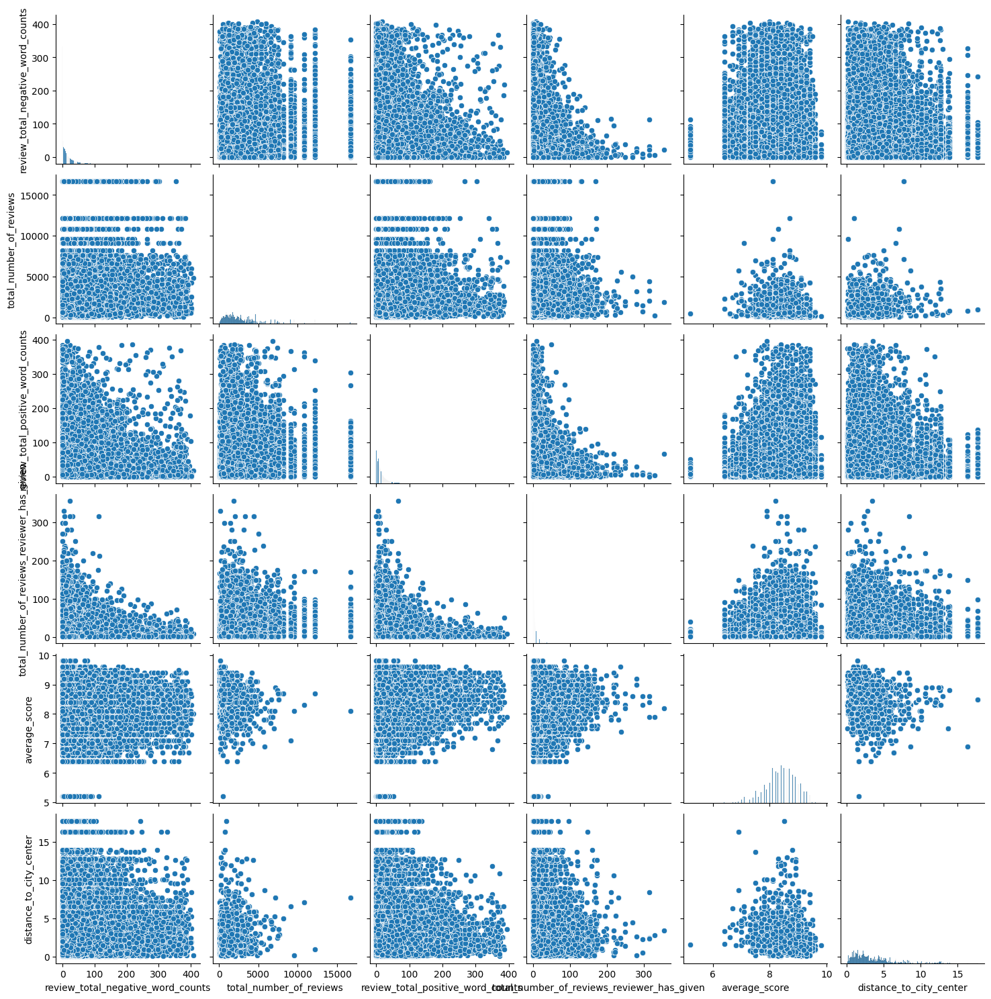

In [229]:
sns.pairplot(dataset_eda[['review_total_negative_word_counts', 'total_number_of_reviews', 'review_total_positive_word_counts', 'total_number_of_reviews_reviewer_has_given', 'average_score', 'distance_to_city_center']])

Из построенных графиков видно что признак 'average_score' распределен нормально, поэтому его следует стандартизировать. Признаки 'review_total_negative_word_counts', 'total_number_of_reviews', 'review_total_positive_word_counts', 'total_number_of_reviews_reviewer_has_given' распределены не нормально. Эти признаки не проходили очистку на предмет выбросов, поэтому для нормализации следует выбрать метод RobustScaler

In [230]:
def norm_stand_hotels(df):
    df = df.copy()

    cols_for_norm = ['additional_number_of_scoring', 'review_total_negative_word_counts', 'total_number_of_reviews', 'review_total_positive_word_counts', 'total_number_of_reviews_reviewer_has_given', 'nights_num', 'bed_num', 'distance_to_city_center']
    scaler_norm_robust = preprocessing.RobustScaler()
    df_norm = scaler_norm_robust.fit_transform(df[cols_for_norm])
    df_norm = pd.DataFrame(df_norm, columns = cols_for_norm)
    df[cols_for_norm] = df_norm[cols_for_norm]

    cols_for_stand = ['average_score']
    scaler_stand = preprocessing.StandardScaler()
    hotels_stand = scaler_stand.fit_transform(df[cols_for_stand])
    hotels_stand = pd.DataFrame(hotels_stand, columns = cols_for_stand)
    df[cols_for_stand] = hotels_stand[cols_for_stand]


    return df

dataset_eda = norm_stand_hotels(dataset_eda)

# Отбор признаков
Построим матрицу корреляции для обнаружения мультиколлениарности

<AxesSubplot:>

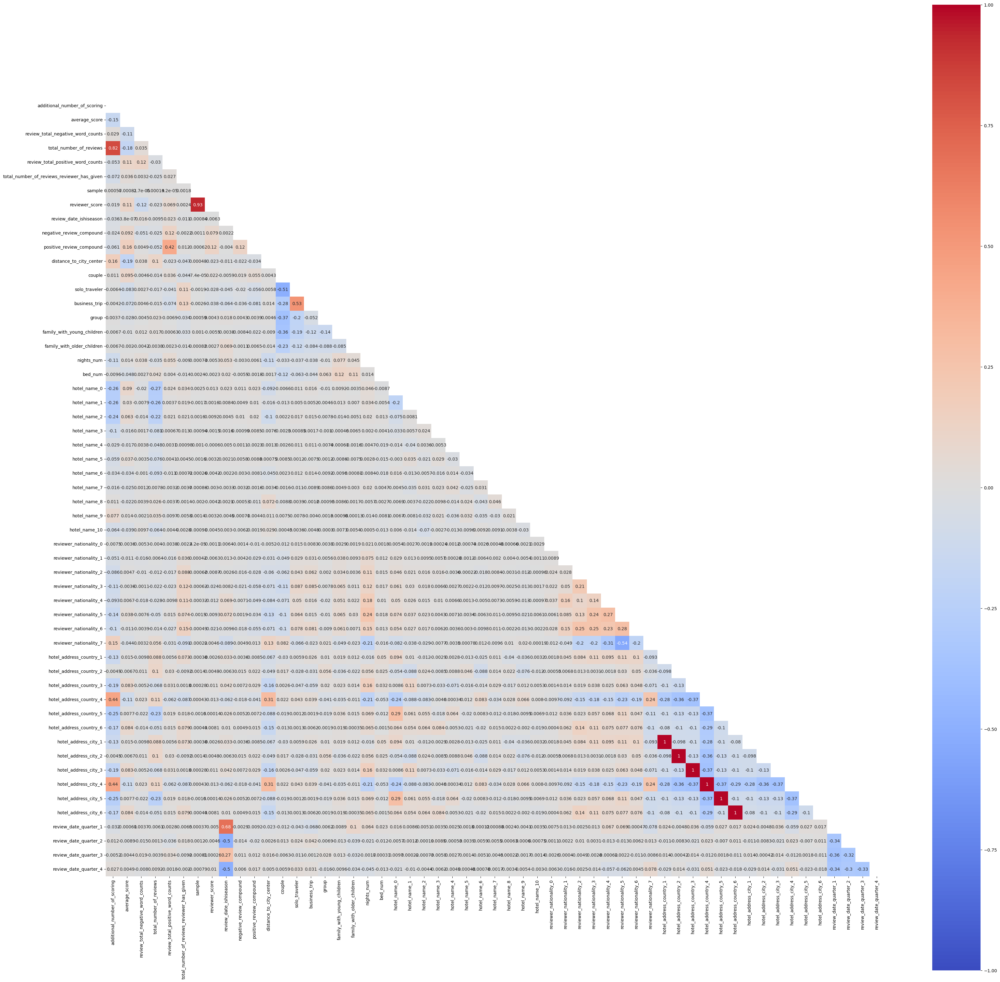

In [231]:
plt.rcParams['figure.figsize'] = (40,40)
corr_matrix = dataset_eda.corr()
sns.heatmap(corr_matrix, annot=True, mask=np.triu(corr_matrix), vmin=-1, vmax=1, center= 0, cmap= 'coolwarm', square=True)

Видно что полностью коррелируют признаки с названием страны и названием города, что ожидаемо. Так же имеют высокую степень корреляции 3-й квартал года с признаком высокого сезона и общее количество отзывов с количеством отзывов в которых имеется только оценка (без подробной информации).
Избавимся от лишних признаков.

In [232]:
def multicorr_rm_hotels(df):
    cols_multi_corr = ['hotel_address_country_1', 'hotel_address_country_2', 'hotel_address_country_3', 'hotel_address_country_4', 'hotel_address_country_5', 'hotel_address_country_6', 'review_date_quarter_3', 'additional_number_of_scoring']
    df.drop(cols_multi_corr, axis = 1, inplace=True)


    return df

dataset_eda = multicorr_rm_hotels(dataset_eda)

# Решение задачи
Построим модель и сделаем предсказание на основе молученной модели данных.

In [233]:
train_data = dataset_eda.query('sample == 1').drop(['sample'], axis=1)
test_data = dataset_eda.query('sample == 0').drop(['sample'], axis=1)

y = train_data.reviewer_score.values
X = train_data.drop(['reviewer_score'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)

model_hotels = RandomForestRegressor(n_estimators=100, verbose=1, n_jobs=-1, random_state=RANDOM_SEED)
model_hotels.fit(X_train, y_train)

y_pred = model_hotels.predict(X_test)
print('MAPE на тестовой выборке: ', metrics.mean_absolute_percentage_error(y_test, y_pred))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.3min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    1.1s


MAPE на тестовой выборке:  0.1256895940576234


[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    2.5s finished


<AxesSubplot:>

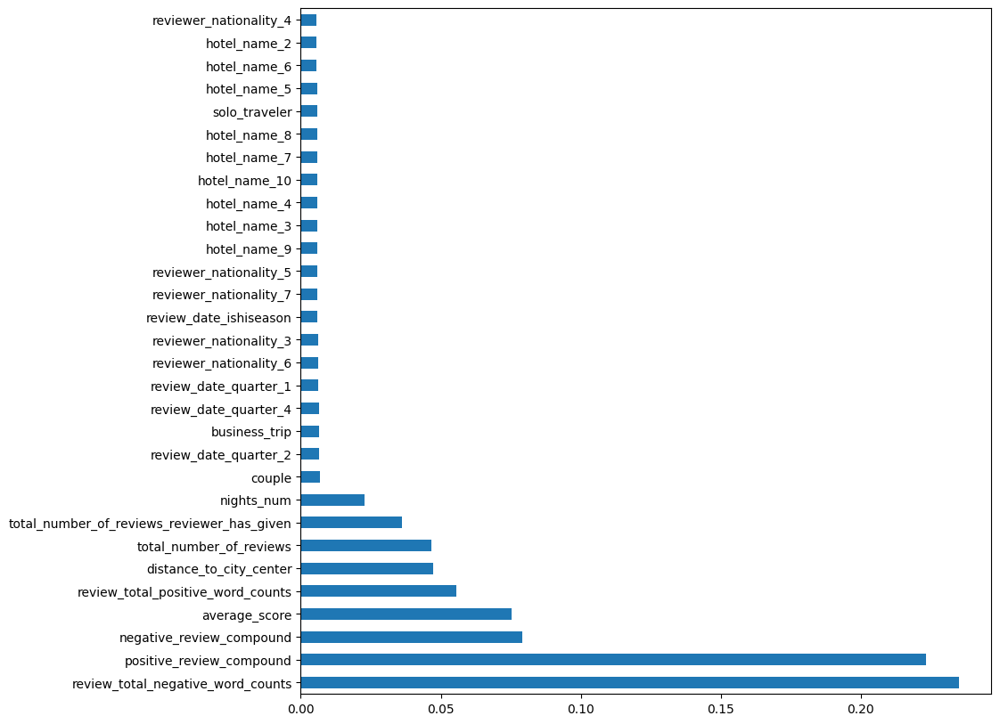

In [235]:
plt.rcParams['figure.figsize'] = (10,10)
feat_importances = pd.Series(model_hotels.feature_importances_, index=X.columns)
feat_importances.nlargest(30).plot(kind='barh')

In [234]:
test_data = test_data.drop(['reviewer_score'], axis=1)
predict_submission = model_hotels.predict(test_data)
sample_submission['reviewer_score'] = predict_submission
sample_submission.to_csv('submission.csv', index=False)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    2.7s finished
